# Hands On Audio Processing
Nama: Cindy Nadila Putri
NIM: 122140002
Mata Kuliah: Sistem Teknologi Multimedia

## Soal 1: Rekaman dan Analisis Suara Multi-Level

In [31]:
import os
import sys
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import librosa
import librosa.display
from IPython.display import Audio, display, HTML

In [32]:

audio_path = 'anchor.wav'

if not os.path.isfile(audio_path):
    print(f"File '{audio_path}' tidak ditemukan di direktori saat ini: {os.getcwd()}")
else:
    display(Audio(audio_path))
    print(f"Audio '{audio_path}' berhasil dimuat!")

Audio 'anchor.wav' berhasil dimuat!


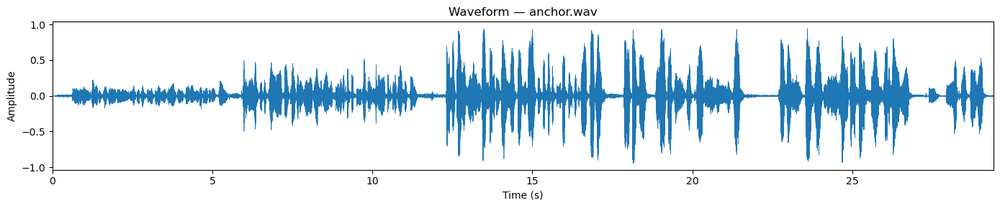

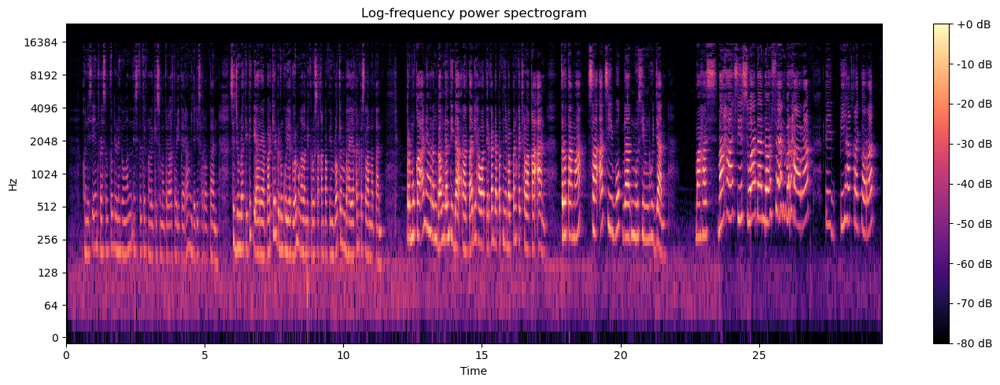

In [33]:
if not os.path.isfile(audio_path):
    raise FileNotFoundError(f"File '{audio_path}' tidak ditemukan di direktori saat ini: {os.getcwd()}")

if 'y' not in globals() or 'sr' not in globals():
    y, sr = librosa.load(audio_path, sr=None, mono=True)
    duration = len(y) / sr
    times = np.linspace(0, duration, num=len(y))
else:
    if 'duration' not in globals():
        duration = len(y) / sr
    if 'times' not in globals() or len(times) != len(y):
        times = np.linspace(0, duration, num=len(y))

# Waveform
plt.figure(figsize=(14, 3))
plt.plot(times, y, linewidth=0.5)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title(f'Waveform — {audio_path}')
plt.xlim(0, duration)
plt.tight_layout()
plt.show()

# Spectrogram (log power) — gunakan DB jika sudah ada, jika belum hitung
if 'DB' not in globals():
    n_fft = globals().get('n_fft', 2048)
    hop_length = globals().get('hop_length', 512)
    D = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))
    DB = librosa.amplitude_to_db(D, ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='magma')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-frequency power spectrogram')
plt.tight_layout()
plt.show()

### Analisis Waveform
Pada 5 detik pertama, amplitudo memiliki panjang gelombang yang relatif kecil karena suara yang muncul hanya suara bisikan. Panjang gelombang cenderung meninggi setiap 5 detik karena perbedaan suara dari kecil, suara biasa, suara keras, suara cempreng, hingga suara teriakan. Dapat disimpulkan bahwa semakin keras suara, maka semakin tinggi panjang gelombang yang dihasilkan.

### Analisis Spektogram
Pada spektogram dapat diidentifikasi nyaring tidaknya suara. Pada awal rekaman suara yang dihasilkan relatif rendah sehingga warna terang yang menyatakan bunyi desibel berkumpul pada frekuensi rendah. Warna terang yang menyatakan bunyi paling nyaring atau dominan semakin naik ke frekuensi sedang hingga tinggi pada detik berikutnya. Hal ini sesuai dengan rekaman yang semakin lama semakin menghasilkan suara keras sehingga suara yang dapat diidentifikasi adalah suara nyaring.

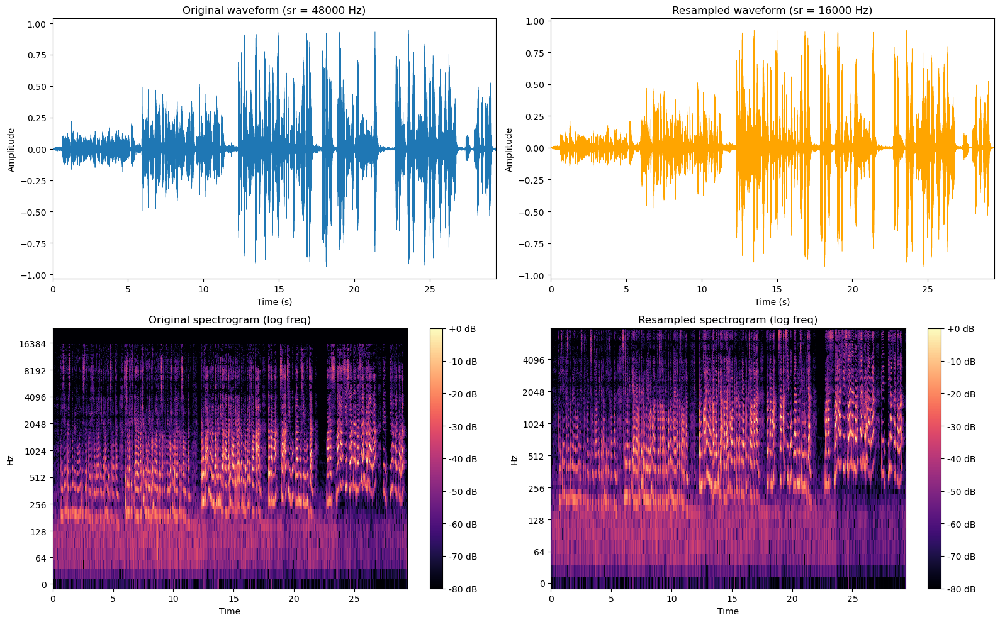

In [34]:
# Resampling anchor.wav and visualize comparison with original
sr_new = 16000  # target sampling rate 

# Perform resampling
y_resampled = librosa.resample(y, orig_sr=sr, target_sr=sr_new)

# Time axes
times_orig = times  # sudah tersedia
times_res = np.linspace(0, len(y_resampled) / sr_new, num=len(y_resampled))

# Compute spectrogram for resampled audio (use scaled n_fft/hop to keep comparable resolution)
n_fft_res = max(256, int(n_fft * sr_new / sr))       
hop_res = max(64, int(hop_length * sr_new / sr))

D_res = np.abs(librosa.stft(y_resampled, n_fft=n_fft_res, hop_length=hop_res))
DB_res = librosa.amplitude_to_db(D_res, ref=np.max)

# Use a common dB scale for fair visual comparison
vmin = min(DB.min(), DB_res.min())
vmax = 0.0

# Plot waveforms and spectrograms side-by-side
plt.figure(figsize=(16, 10))

# Waveform - original
plt.subplot(2, 2, 1)
plt.plot(times_orig, y, linewidth=0.4)
plt.xlim(0, duration)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original waveform (sr = %d Hz)' % sr)

# Waveform - resampled
plt.subplot(2, 2, 2)
plt.plot(times_res, y_resampled, linewidth=0.4, color='orange')
plt.xlim(0, times_res[-1])
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Resampled waveform (sr = %d Hz)' % sr_new)

# Spectrogram - original
plt.subplot(2, 2, 3)
librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='magma', vmin=vmin, vmax=vmax)
plt.colorbar(format='%+2.0f dB')
plt.title('Original spectrogram (log freq)')

# Spectrogram - resampled
plt.subplot(2, 2, 4)
librosa.display.specshow(DB_res, sr=sr_new, hop_length=hop_res, x_axis='time', y_axis='log', cmap='magma', vmin=vmin, vmax=vmax)
plt.colorbar(format='%+2.0f dB')
plt.title('Resampled spectrogram (log freq)')

plt.tight_layout()
plt.show()

### Perbandingan: Sebelum vs Setelah Resampling

Berikut rangkuman singkat perbedaan kualitas dan durasi antara audio asli (sr = 48000 Hz) dan hasil resampling (sr = 16000 Hz).

### Durasi
- Durasi asli: 29.418666666666667 s  
- Durasi setelah resampling: 470699 / 16000 = 29.4186874375 s  
- Kesimpulan: perbedaan durasi ≪ 1 ms (≈ 2.07e-05 s) — praktis tidak berbeda.

### Resolusi frekuensi dan jangkauan
Saat sinyal audio di-resample dari 48 kHz menjadi 16 kHz, terjadi perubahan signifikan pada representasi frekuensinya. Berdasarkan teorema Nyquist, jangkauan frekuensi maksimal yang dapat ditangkap turun drastis dari 24 kHz menjadi hanya 8 kHz, yang berarti semua komponen frekuensi di atas 8 kHz akan hilang. Konsekuensinya, jumlah bin frekuensi pada spektrogram juga berkurang signifikan, dari 1025 menjadi 342 bin. Meskipun demikian, lebar atau resolusi per bin frekuensi tetap dijaga hampir sama, yaitu sekitar 23.4 Hz. Kesimpulannya, proses downsampling ini berhasil mempertahankan resolusi frekuensi relatif pada rentang yang tersisa, tetapi harus dibayar dengan hilangnya seluruh detail informasi pada frekuensi tinggi.

### Resolusi waktu
- Jumlah frame (kolom DB):
    - Asli: 2759 frame
    - Resampled: 2769 frame
- Hop length (waktu antar frame) skala telah disesuaikan sehingga resolusi waktu tetap mirip.
- Kesimpulan: resolusi temporal relatif setara antara kedua versi.

### Spektrogram & Energi (kualitas subjektif)
Dengan menggunakan skala desibel (dB) yang sama pada kedua spektrogram, perbandingan energi menjadi valid dan dapat diandalkan. Perbedaan visual yang paling mencolok adalah hilangnya seluruh energi di frekuensi atas 8 kHz pada versi 16 kHz, yang secara auditori membuat suara menjadi kurang “cerah” atau kehilangan “udara”. Meskipun demikian, bentuk umum envelope amplitudo serta dominasi energi pada frekuensi rendah hingga sedang umumnya tetap terjaga, menunjukkan bahwa karakter dasar suara tidak berubah drastis. Perlu dicatat juga bahwa filter resampling terkadang dapat memperkenalkan sedikit perubahan spektral atau artefak di sekitar batas frekuensi transisi. Kesimpulannya, meskipun loudness dan konten frekuensi rendah-menengah tetap serupa, detail frekuensi tinggi dan tekstur halus dari suara asli berkurang secara signifikan pada hasil resampling.


## Soal 2: Noise dengan Filtering

In [42]:
from scipy.signal import butter, lfilter, freqz, sosfilt

In [36]:
audio_path = 'perkenalan.wav'

if not os.path.isfile(audio_path):
    print(f"File '{audio_path}' tidak ditemukan di direktori saat ini: {os.getcwd()}")
else:
    display(Audio(audio_path))
    print(f"Audio '{audio_path}' berhasil dimuat!")

Audio 'perkenalan.wav' berhasil dimuat!


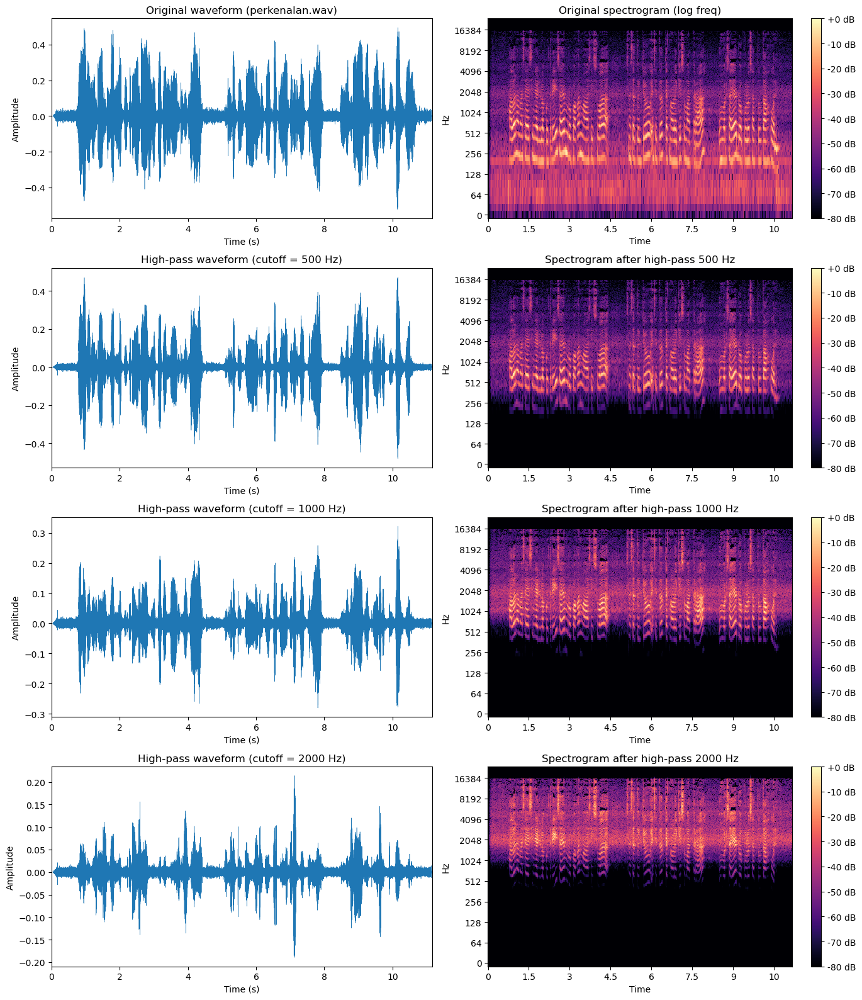

perkenalan_hp_500Hz.wav: cutoff=500 Hz, duration=11.157s, RMS=0.067891


perkenalan_hp_1000Hz.wav: cutoff=1000 Hz, duration=11.157s, RMS=0.030310


perkenalan_hp_2000Hz.wav: cutoff=2000 Hz, duration=11.157s, RMS=0.013299


In [37]:
cutoffs = [500, 1000, 2000]  # Hz
order = 6  # butterworth order

# Apply high-pass (equalization) filters to perkenalan.wav at multiple cutoffs (500, 1000, 2000 Hz)
def butter_highpass(cutoff_hz, fs, order=6):
    nyq = 0.5 * fs
    normal_cutoff = float(cutoff_hz) / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

cutoffs_hp = cutoffs  # reuse existing list [500, 1000, 2000]
order_hp = order      # reuse existing order (6)

filtered_hp_signals = {}
DB_hp_filtered = {}

for fc in cutoffs_hp:
    b_hp, a_hp = butter_highpass(fc, sr_p, order=order_hp)
    y_hp = lfilter(b_hp, a_hp, y_p)
    fname_hp = f'perkenalan_hp_{fc}Hz.wav'
    sf.write(fname_hp, y_hp, sr_p)
    filtered_hp_signals[fc] = (y_hp, fname_hp)
    D_hp = np.abs(librosa.stft(y_hp, n_fft=n_fft, hop_length=hop_length))
    DB_hp_filtered[fc] = librosa.amplitude_to_db(D_hp, ref=np.max)

# common dB scale
vmin_hp = min(DB_p.min(), min(v.min() for v in DB_hp_filtered.values()))
vmax_hp = 0.0

# Plot original + highpass filtered results
nrows_hp = 1 + len(cutoffs_hp)
plt.figure(figsize=(14, 4 * nrows_hp))

# original
plt.subplot(nrows_hp, 2, 1)
plt.plot(times_p, y_p, linewidth=0.4)
plt.xlim(0, duration_p)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title(f'Original waveform ({audio_path})')

plt.subplot(nrows_hp, 2, 2)
librosa.display.specshow(DB_p, sr=sr_p, hop_length=hop_length, x_axis='time', y_axis='log',
                         cmap='magma', vmin=vmin_hp, vmax=vmax_hp)
plt.colorbar(format='%+2.0f dB')
plt.title('Original spectrogram (log freq)')

# filtered rows (high-pass)
for i, fc in enumerate(cutoffs_hp, start=1):
    y_hp, fname_hp = filtered_hp_signals[fc]
    DBhp = DB_hp_filtered[fc]
    row = i + 1
    plt.subplot(nrows_hp, 2, 2*(row-1) + 1)
    times_hp = np.linspace(0, len(y_hp) / sr_p, num=len(y_hp))
    plt.plot(times_hp, y_hp, linewidth=0.4)
    plt.xlim(0, duration_p)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(f'High-pass waveform (cutoff = {fc} Hz)')

    plt.subplot(nrows_hp, 2, 2*(row-1) + 2)
    librosa.display.specshow(DBhp, sr=sr_p, hop_length=hop_length, x_axis='time', y_axis='log',
                             cmap='magma', vmin=vmin_hp, vmax=vmax_hp)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram after high-pass {fc} Hz')

plt.tight_layout()
plt.show()

# Summary + audio players
for fc in cutoffs_hp:
    y_hp, fname_hp = filtered_hp_signals[fc]
    rms_hp = np.sqrt(np.mean(y_hp**2))
    print(f"{fname_hp}: cutoff={fc} Hz, duration={len(y_hp)/sr_p:.3f}s, RMS={rms_hp:.6f}")
    display(Audio(y_hp, rate=sr_p))

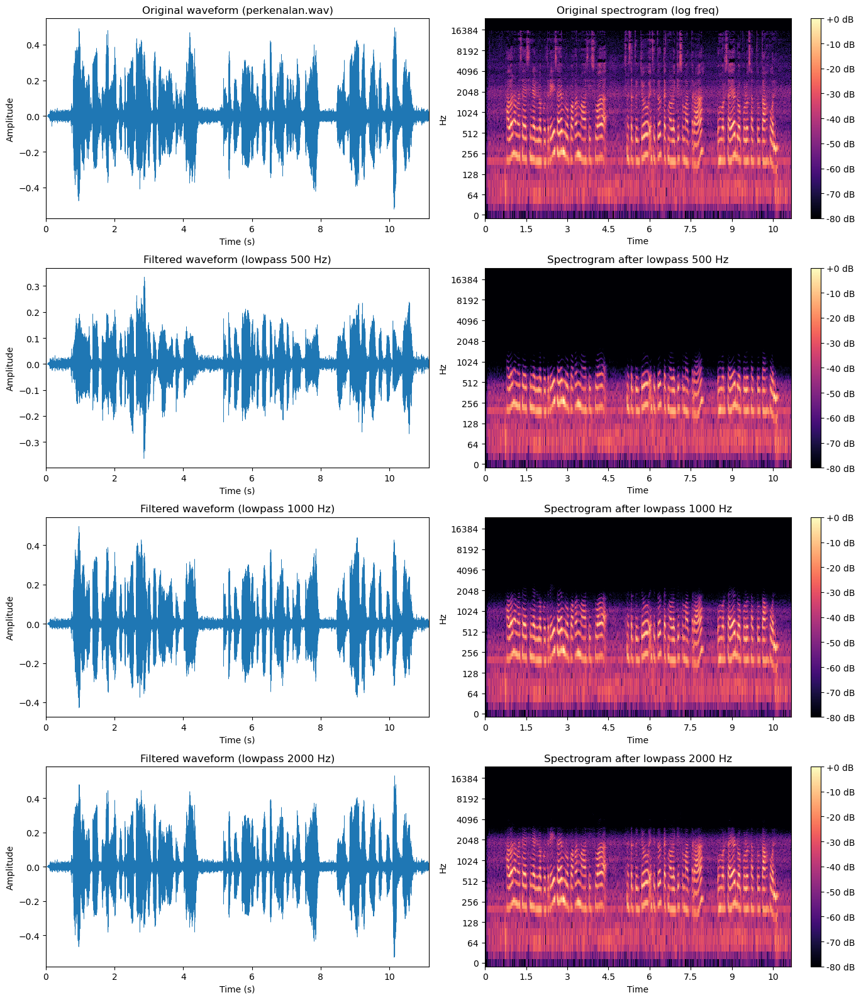

perkenalan_lp_500Hz.wav: cutoff=500 Hz, duration=11.157s, RMS=0.055318


perkenalan_lp_1000Hz.wav: cutoff=1000 Hz, duration=11.157s, RMS=0.082161


perkenalan_lp_2000Hz.wav: cutoff=2000 Hz, duration=11.157s, RMS=0.086558


In [38]:
# Load perkenalan.wav into its own variables (don't overwrite existing `y` / `sr`)
y_p, sr_p = librosa.load(audio_path, sr=None, mono=True)
duration_p = len(y_p) / sr_p
times_p = np.linspace(0, duration_p, num=len(y_p))

# design helper
def butter_lowpass(cutoff_hz, fs, order=6):
    nyq = 0.5 * fs
    normal_cutoff = float(cutoff_hz) / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

# compute original spectrogram dB
D_p = np.abs(librosa.stft(y_p, n_fft=n_fft, hop_length=hop_length))
DB_p = librosa.amplitude_to_db(D_p, ref=np.max)

# Apply filters, save files, compute spectrograms for plotting
filtered_signals = {}
DB_filtered = {}

for fc in cutoffs:
    b, a = butter_lowpass(fc, sr_p, order=order)
    y_f = lfilter(b, a, y_p)                      # apply filter
    fname = f'perkenalan_lp_{fc}Hz.wav'
    sf.write(fname, y_f, sr_p)                    # save filtered audio
    filtered_signals[fc] = (y_f, fname)
    Df = np.abs(librosa.stft(y_f, n_fft=n_fft, hop_length=hop_length))
    DB_filtered[fc] = librosa.amplitude_to_db(Df, ref=np.max)

# Determine common dB colormap scale for fair comparison
vmin_all = min(DB_p.min(), min(v.min() for v in DB_filtered.values()))
vmax_all = 0.0

# Plot original + filtered waveforms and spectrograms
nrows = 1 + len(cutoffs)
plt.figure(figsize=(14, 4 * nrows))

# original row
plt.subplot(nrows, 2, 1)
plt.plot(times_p, y_p, linewidth=0.4)
plt.xlim(0, duration_p)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title(f'Original waveform ({audio_path})')

plt.subplot(nrows, 2, 2)
librosa.display.specshow(DB_p, sr=sr_p, hop_length=hop_length, x_axis='time', y_axis='log', cmap='magma', vmin=vmin_all, vmax=vmax_all)
plt.colorbar(format='%+2.0f dB')
plt.title('Original spectrogram (log freq)')

# filtered rows
for i, fc in enumerate(cutoffs, start=1):
    y_f, fname = filtered_signals[fc]
    DBf = DB_filtered[fc]
    row = i + 1  # because original is row 1
    plt.subplot(nrows, 2, 2*(row-1) + 1)
    times_f = np.linspace(0, len(y_f) / sr_p, num=len(y_f))
    plt.plot(times_f, y_f, linewidth=0.4)
    plt.xlim(0, duration_p)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(f'Filtered waveform (lowpass {fc} Hz)')

    plt.subplot(nrows, 2, 2*(row-1) + 2)
    librosa.display.specshow(DBf, sr=sr_p, hop_length=hop_length, x_axis='time', y_axis='log', cmap='magma', vmin=vmin_all, vmax=vmax_all)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram after lowpass {fc} Hz')

plt.tight_layout()
plt.show()

# Display small summary and players for the filtered files
for fc in cutoffs:
    y_f, fname = filtered_signals[fc]
    rms = np.sqrt(np.mean(y_f**2))
    print(f"{fname}: cutoff={fc} Hz, duration={len(y_f)/sr_p:.3f}s, RMS={rms:.6f}")
    display(Audio(y_f, rate=sr_p))

Menerapkan filter band-stop secara berurutan...
Filter untuk band 450-550 Hz telah diterapkan.
Filter untuk band 950-1050 Hz telah diterapkan.
Filter untuk band 1950-2050 Hz telah diterapkan.


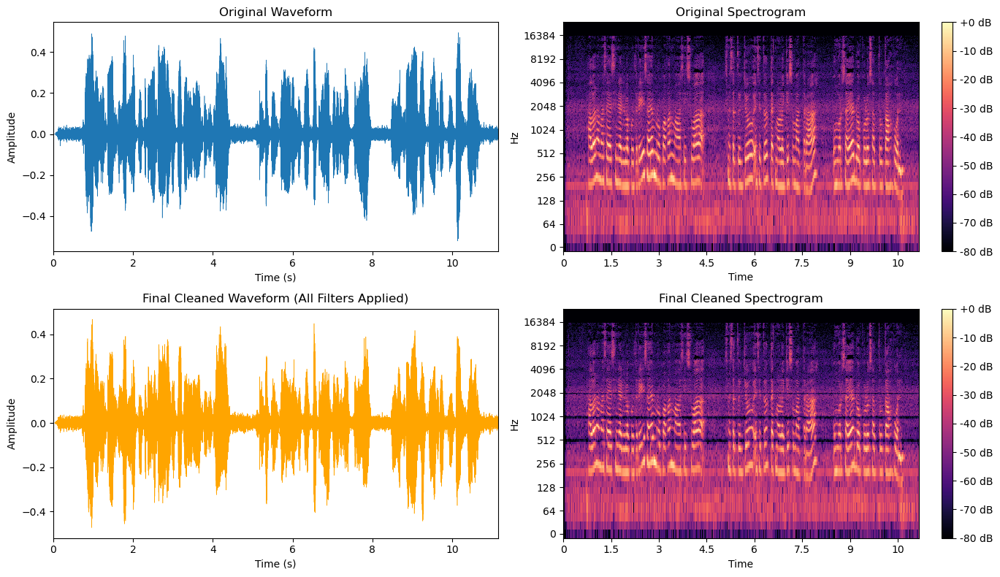


File Audio Akhir: perkenalan_cleaned_combined.wav
Removed bands centered at: ~500Hz, ~1000Hz, ~2000Hz
Duration: 11.157s, Final RMS: 0.081254


In [43]:
bw = 100.0
y_clean = y_p.copy()

print("Menerapkan filter band-stop secara berurutan...")
for fc in cutoffs_bp:
    low_hz = max(1.0, fc - bw / 2.0)
    high_hz = min(sr_p / 2.0 - 10.0, fc + bw / 2.0) # Memberi jarak aman 10Hz

    if low_hz >= high_hz:
        print(f"Skipping filter at {fc} Hz, invalid range.")
        continue

    # Desain dan terapkan filter band-stop
    sos_bs = butter(order_bp, [low_hz, high_hz], btype='bandstop', fs=sr_p, analog=False, output='sos')
    y_clean = sosfilt(sos_bs, y_clean) # Terapkan filter pada hasil sebelumnya
    print(f"Filter untuk band {int(low_hz)}-{int(high_hz)} Hz telah diterapkan.")

# Simpan satu file audio hasil akhir
fname_clean = 'perkenalan_cleaned_combined.wav'
sf.write(fname_clean, y_clean, sr_p)

# Buat spektrogram dari sinyal yang sudah bersih
D_clean = np.abs(librosa.stft(y_clean, n_fft=n_fft, hop_length=hop_length))
DB_clean = librosa.amplitude_to_db(D_clean, ref=np.max)

# Skala dB gabungan untuk perbandingan visual yang adil
vmin = min(DB_p.min(), DB_clean.min())
vmax = 0.0

# Plotting untuk membandingkan original dengan hasil akhir
plt.figure(figsize=(14, 8))

# Original Waveform
plt.subplot(2, 2, 1)
plt.plot(times_p, y_p, linewidth=0.4)
plt.xlim(0, duration_p)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original Waveform')

# Original Spectrogram
plt.subplot(2, 2, 2)
librosa.display.specshow(DB_p, sr=sr_p, hop_length=hop_length, x_axis='time', y_axis='log',
                         cmap='magma', vmin=vmin, vmax=vmax)
plt.colorbar(format='%+2.0f dB')
plt.title('Original Spectrogram')

# Cleaned Waveform
plt.subplot(2, 2, 3)
times_c = np.linspace(0, len(y_clean) / sr_p, num=len(y_clean))
plt.plot(times_c, y_clean, linewidth=0.4, color='orange')
plt.xlim(0, duration_p)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Final Cleaned Waveform (All Filters Applied)')

# Cleaned Spectrogram
plt.subplot(2, 2, 4)
librosa.display.specshow(DB_clean, sr=sr_p, hop_length=hop_length, x_axis='time', y_axis='log',
                             cmap='magma', vmin=vmin, vmax=vmax)
plt.colorbar(format='%+2.0f dB')
plt.title('Final Cleaned Spectrogram')

plt.tight_layout()
plt.show()

# Ringkasan dan pemutaran audio hasil akhir
rms_clean = np.sqrt(np.mean(y_clean**2))
removed_bands_str = ", ".join([f"~{fc}Hz" for fc in cutoffs_bp])
print(f"\nFile Audio Akhir: {fname_clean}")
print(f"Removed bands centered at: {removed_bands_str}")
print(f"Duration: {len(y_clean)/sr_p:.3f}s, Final RMS: {rms_clean:.6f}")
display(Audio(y_clean, rate=sr_p))



In [40]:
from pydub import AudioSegment

In [41]:
import pyloudnorm as pyln
from pydub.effects import normalize, compress_dynamic_range